# A classical analog to demonstrate decay rate enhancement via couplings

In this tutorial we will create a classical analog to illustrate how decay rates can be enhanced through couplings and resulting excitation transfer. 

## 1. Python helper functions

In [1]:
# loading some common python libraries

import numpy as np
from numpy import linalg
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import Image
from IPython.core.display import HTML 
import sympy as sp
#from google.colab.output._publish import javascript
mathjaxurl = "https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.3/latest.js?config=default"
sp.init_printing(use_latex='mathjax') 
import matplotlib.patches as patches
import pandas as pd

In [2]:
def create_fig1(): # create 1 empty subplots with 3 empty lines in each 
    global lines1A
    
    fig1 = plt.figure() #figsize=(8,2)

    ax1A = fig1.add_subplot(111, xlim=(-5, 5), ylim=(-3, 3))
    ax1A.grid(color='lightgrey',alpha=1)
    ax1A.set_xticks(np.arange(-5,5,1))
    ax1A.set_aspect('equal', 'box')    
    
    lines1A = []
    for i in np.arange(0,5,1):
        lobj = ax1A.plot([], [], 'o-')[0] # , lw=0, color='green'
        lines1A.append(lobj)

    plt.close() 
    return fig1

In [3]:
def animate1(i,data_graph1): # animation function that is called once for every frame (for fig 1)
    global lines1A
    
    for lineno,_ in enumerate(data_graph1): # strep through the list and the data for each line and assign data for frame i
        
        lines1A[lineno].set_xdata(data_graph1[lineno][i][0]) 
        lines1A[lineno].set_ydata(data_graph1[lineno][i][1])

In [4]:
def add_pendulum_patches(thisfigure):
    
    thisaxis = thisfigure.axes[0]
    
    thisaxis.add_patch(patches.Rectangle(xy=(-5, 2),width=10,height=1,facecolor="gainsboro"))

In [5]:
def add_polar_coordinates(df):
    alltheta1 = df.x1
    df['sin1'] = np.sin(alltheta1)*L1
    df['cos1']  = np.cos(alltheta1)*L1
    alltheta2 = df.x2
    df['sin2'] = np.sin(alltheta2)*L2
    df['cos2'] = np.cos(alltheta2)*L2
    alltheta3 = df.x3
    df['sin3'] = np.sin(alltheta3)*L3
    df['cos3'] = np.cos(alltheta3)*L3   
    return df

## 2. REVIEW: a damped coupled system

Here is a brief review of the last part of the previous notebook:

For three coupled oscillators we can get the equations of motion as follows. In this system, we assume that each oscillator has its own spring constant k1, k2, and k3 and in addition, we have two equal coupling constants k_c between the oscillators. 

Starting with the force equations:

$$F_1 = m \ddot x_1 = -k_1x_1 -k_c(x_1-x_2) - c \dot {x_1}$$

$$F_2 = m \ddot x_2 = -k_2x_2 -k_c(x_2-x_1) -k_c(x_2-x_3) - c \dot {x_2}$$

$$F_3 = m \ddot x_2 = -k_3x_3 -k_c(x_3-x_2) - c \dot {x_3}$$

$$\ddot {x} + c \dot {x} + \frac{k}{m} x = 0$$

Organizing in terms of x1 and x2 gives us:

$$\ddot x_1 = \dot v_1 = x_1 \frac{-k_1-k_c}{m_1} + x_2 \frac{k_c}{m_1} - c v_1$$
$$\ddot x_2 = \dot v_2 = x_1 \frac{k_c}{m_2} + x_2 \frac{-k_2-2k_c}{m_2} + x_3 \frac{k_c}{m_2} - c v_2$$
$$\ddot x_3 = \dot v_3 = x_2 \frac{k_c}{m_3} + x_3 \frac{-k_3-k_c}{m_3} - c v_3$$

From this, we can create the time evolution function based on the Euler-Cromer method:

In [6]:
def get_next_state_3CD(present_state,dt):
        
    global m1, m2, m3, k1, k1, k3, kc
        
    x1 = present_state[0]
    v1 = present_state[1]
    x2 = present_state[2]
    v2 = present_state[3]
    x3 = present_state[4]
    v3 = present_state[5]    
        
    dx1 = v1*dt       
    nextx1 = x1 + dx1
        
    dx2 = v2*dt       
    nextx2 = x2 + dx2
        
    dx3 = v3*dt       
    nextx3 = x3 + dx3        
        
    dv1 = (nextx1 * -(k1+kc)/m1 + nextx2 * kc/m1 - v1*c)*dt
    nextv1 = v1 + dv1        
        
    dv2 = (nextx1 * kc/m2 + nextx2 * -(k2+2.0*kc)/m2 + nextx3 * kc/m2 - v2*c)*dt
    nextv2 = v2 + dv2  
        
    dv3 = (nextx2 * kc/m3 + nextx3 * -(k3+kc)/m3 - v3*c)*dt
    nextv3 = v3 + dv3          
        
    next_state = np.array([nextx1,nextv1,nextx2,nextv2,nextx3,nextv3])
    return next_state 

## 4. Creating the illustration

## 4.1. Setting the main parameters

In [7]:
t_end = 250 # time for simulations
allt = np.arange(0,t_end,0.1) # time vector size 2000

In [8]:
dt = 0.1

In [9]:
k1 = k2 = k3 = 1 
m1 = m2 = m3 = 1
c = 0.02
kc = 0.1 #0.5

In [10]:
L1 = L3 = 1
L2 = 2

In [11]:
x1i = 0 #initial displacement m1
v1i = 0 #initial velocity m1
x2i = -1 #initial displacement m2
v2i = 0 #initial velocity m2
x3i = 0 #initial displacement m3
v3i = 0 #initial velocity m3

## 4.2. Uncoupled damped oscillator

In [12]:
kc = 0

In [13]:
thisstate = np.array([x1i,v1i,x2i,v2i,x3i,v3i]) 
thisstate

array([ 0,  0, -1,  0,  0,  0])

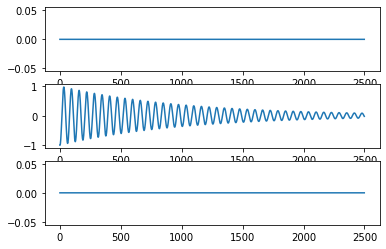

In [14]:
allstates = []
for index,t in enumerate(allt): # step through every time step

    allstates.append(thisstate)    
    nextstate = get_next_state_3CD(thisstate, dt)  
    thisstate = nextstate    
    
df1 = pd.DataFrame(np.row_stack(allstates), columns = ['x1', 'v1', 'x2', 'v2', 'x3', 'v3']) 
df1.insert(0, "time", allt, True) 
df1 = add_polar_coordinates(df1)

plt.subplot(311)
plt.plot(df1.x1)
plt.subplot(312)
plt.plot(df1.x2)
plt.subplot(313)
plt.plot(df1.x3)

In [15]:
df1[310:320] # index 314 is a peak for x2

,time,x1,v1,x2,v2,x3,v3,sin1,cos1,sin2,cos2,sin3,cos3
310,31.0,0.0,0.0,-0.661721,-0.278592,0.0,0.0,0.0,1.0,-1.228951,1.577872,0.0,1.0
311,31.1,0.0,0.0,-0.689580,-0.209077,0.0,0.0,0.0,1.0,-1.272427,1.543026,0.0,1.0
312,31.2,0.0,0.0,-0.710488,-0.137610,0.0,0.0,0.0,1.0,-1.304408,1.516087,0.0,1.0
313,31.3,0.0,0.0,-0.724249,-0.064910,0.0,0.0,0.0,1.0,-1.325146,1.497994,0.0,1.0
314,31.4,0.0,0.0,-0.730740,0.008294,0.0,0.0,0.0,1.0,-1.334842,1.489361,0.0,1.0
315,31.5,0.0,0.0,-0.729911,0.081268,0.0,0.0,0.0,1.0,-1.333606,1.490468,0.0,1.0
316,31.6,0.0,0.0,-0.721784,0.153284,0.0,0.0,0.0,1.0,-1.321450,1.501257,0.0,1.0
317,31.7,0.0,0.0,-0.706455,0.223623,0.0,0.0,0.0,1.0,-1.298283,1.521335,0.0,1.0
318,31.8,0.0,0.0,-0.684093,0.291585,0.0,0.0,0.0,1.0,-1.263941,1.549985,0.0,1.0
319,31.9,0.0,0.0,-0.654935,0.356495,0.0,0.0,0.0,1.0,-1.218215,1.586175,0.0,1.0


In [16]:
dfA = df1[:315]
dfA

,time,x1,v1,x2,v2,x3,v3,sin1,cos1,sin2,cos2,sin3,cos3
0,0.0,0.0,0.0,-1.000000,0.000000,0.0,0.0,0.0,1.0,-1.682942,1.080605,0.0,1.0
1,0.1,0.0,0.0,-1.000000,0.100000,0.0,0.0,0.0,1.0,-1.682942,1.080605,0.0,1.0
2,0.2,0.0,0.0,-0.990000,0.198800,0.0,0.0,0.0,1.0,-1.672052,1.097380,0.0,1.0
3,0.3,0.0,0.0,-0.970120,0.295414,0.0,0.0,0.0,1.0,-1.649907,1.130401,0.0,1.0
4,0.4,0.0,0.0,-0.940579,0.388881,0.0,0.0,0.0,1.0,-1.615798,1.178641,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
310,31.0,0.0,0.0,-0.661721,-0.278592,0.0,0.0,0.0,1.0,-1.228951,1.577872,0.0,1.0
311,31.1,0.0,0.0,-0.689580,-0.209077,0.0,0.0,0.0,1.0,-1.272427,1.543026,0.0,1.0
312,31.2,0.0,0.0,-0.710488,-0.137610,0.0,0.0,0.0,1.0,-1.304408,1.516087,0.0,1.0
313,31.3,0.0,0.0,-0.724249,-0.064910,0.0,0.0,0.0,1.0,-1.325146,1.497994,0.0,1.0


In [17]:
offset1 = len(dfA)-1
x2i_newB = dfA.x2[offset1]
x2i_newB # this will be the new initial condition for the next section

-0.7307400705921927

In [18]:
df = df1

# create position vectors for the first animated graph
data1,data2,data3,data4,data5 = ([],[],[],[],[])
for index,t in enumerate(allt): # step through every time step

    if index % 5 == 0: # take only every nth element    
        data1.append([[-3,-3+df.sin1[index]],[2,2-df.cos1[index]]]) # first number: x anchor; second number: y anchor 
        data2.append([[0,0+df.sin2[index]],[2,2-df.cos2[index]]]) # first number: x anchor; second number: y anchor 
        data3.append([[3,3+df.sin3[index]],[2,2-df.cos3[index]]]) # first number: x anchor; second number: y anchor 
        data4.append([[-3+df.sin1[index],0+df.sin2[index]],[2-df.cos1[index],2-df.cos2[index]]]) 
        data5.append([[0+df.sin2[index],3+df.sin3[index]],[2-df.cos2[index],2-df.cos3[index]]]) 

In [19]:
# call the animation function 
subplot1_data = [[np.asarray(data1),np.asarray(data2),np.asarray(data3),np.asarray(data4),np.asarray(data5)]]

thisfig = create_fig1()
add_pendulum_patches(thisfig)
lines1A[3].set_lw(1)
lines1A[4].set_lw(1)
lines1A[3].set_marker('')
lines1A[4].set_marker('')
lines1A[3].set_color('brown')
lines1A[4].set_color('brown')

ani = animation.FuncAnimation(thisfig,animate1,frames=200,interval=100,fargs=(subplot1_data))
rc('animation', html='jshtml')
ani        

## 4.3. Coupled damped oscillator

In [20]:
kc = 0.1 # now rerun with the coupling and with the new initial condition

In [21]:
thisstate = np.array([x1i,v1i,x2i_newB,v2i,x3i,v3i])
thisstate

array([ 0.        ,  0.        , -0.73074007,  0.        ,  0.        ,
        0.        ])

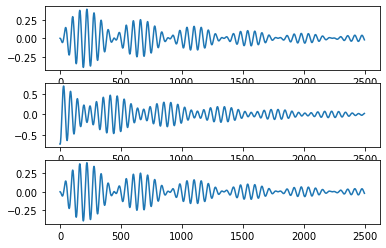

In [22]:
allstates = []
for index,t in enumerate(allt): # step through every time step

    allstates.append(thisstate)    
    nextstate = get_next_state_3CD(thisstate, dt)  
    thisstate = nextstate    
    
df2 = pd.DataFrame(np.row_stack(allstates), columns = ['x1', 'v1', 'x2', 'v2', 'x3', 'v3']) 
df2.insert(0, "time", allt, True) 
df2 = add_polar_coordinates(df2)

plt.subplot(311)
plt.plot(df2.x1)
plt.subplot(312)
plt.plot(df2.x2)
plt.subplot(313)
plt.plot(df2.x3)

,time,x1,v1,x2,v2,x3,v3,sin1,cos1,sin2,cos2,sin3,cos3
215,21.5,0.325008,0.215221,-0.141446,-0.161794,0.325008,0.215221,0.319316,0.947648,-0.281950,1.980026,0.319316,0.947648
216,21.6,0.346530,0.175096,-0.157626,-0.135625,0.346530,0.175096,0.339636,0.940557,-0.313948,1.975206,0.339636,0.940557
217,21.7,0.364040,0.132989,-0.171188,-0.107530,0.364040,0.132989,0.356052,0.934466,-0.340707,1.970766,0.356052,0.934466
218,21.8,0.377339,0.089397,-0.181941,-0.077935,0.377339,0.089397,0.368448,0.929648,-0.361878,1.966989,0.368448,0.929648
219,21.9,0.386278,0.044830,-0.189735,-0.047286,0.386278,0.044830,0.376744,0.926318,-0.377197,1.964109,0.376744,0.926318
220,22.0,0.390761,-0.000188,-0.194463,-0.016040,0.390761,-0.000188,0.380893,0.924619,-0.386480,1.962303,0.380893,0.924619
221,22.1,0.390743,-0.045130,-0.196067,0.015335,0.390743,-0.045130,0.380875,0.924626,-0.389627,1.961681,0.380875,0.924626
222,22.2,0.386230,-0.089470,-0.194534,0.046373,0.386230,-0.089470,0.376698,0.926336,-0.386619,1.962276,0.376698,0.926336
223,22.3,0.377283,-0.132691,-0.189897,0.076613,0.377283,-0.132691,0.368396,0.929669,-0.377515,1.964047,0.368396,0.929669
224,22.4,0.364013,-0.174290,-0.182235,0.105608,0.364013,-0.174290,0.356028,0.934475,-0.362457,1.966882,0.356028,0.934475


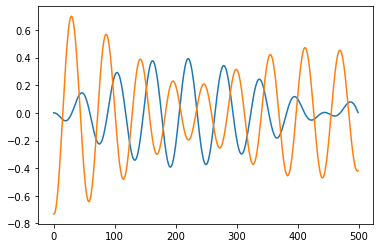

In [24]:
plt.plot(df2.x1[:500])
plt.plot(df2.x2[:500])
np.max(df2.x1[:500]) # index 220, value 0.390761
df2[215:225] 

In [25]:
dfB = df2[:221]
dfB

,time,x1,v1,x2,v2,x3,v3,sin1,cos1,sin2,cos2,sin3,cos3
0,0.0,0.000000,0.000000,-0.730740,0.000000,0.000000,0.000000,0.000000,1.000000,-1.334842,1.489361,0.000000,1.000000
1,0.1,0.000000,-0.007307,-0.730740,0.087689,0.000000,-0.007307,0.000000,1.000000,-1.334842,1.489361,0.000000,1.000000
2,0.2,-0.000731,-0.014432,-0.721971,0.174135,-0.000731,-0.014432,-0.000731,1.000000,-1.321731,1.501009,-0.000731,1.000000
3,0.3,-0.002174,-0.021210,-0.704558,0.258291,-0.002174,-0.021210,-0.002174,0.999998,-1.295394,1.523796,-0.002174,0.999998
4,0.4,-0.004295,-0.027482,-0.678729,0.339135,-0.004295,-0.027482,-0.004295,0.999991,-1.255608,1.556743,-0.004295,0.999991
...,...,...,...,...,...,...,...,...,...,...,...,...,...
216,21.6,0.346530,0.175096,-0.157626,-0.135625,0.346530,0.175096,0.339636,0.940557,-0.313948,1.975206,0.339636,0.940557
217,21.7,0.364040,0.132989,-0.171188,-0.107530,0.364040,0.132989,0.356052,0.934466,-0.340707,1.970766,0.356052,0.934466
218,21.8,0.377339,0.089397,-0.181941,-0.077935,0.377339,0.089397,0.368448,0.929648,-0.361878,1.966989,0.368448,0.929648
219,21.9,0.386278,0.044830,-0.189735,-0.047286,0.386278,0.044830,0.376744,0.926318,-0.377197,1.964109,0.376744,0.926318


In [26]:
offset2 = len(dfB)-1
x2i_newC = dfB.x2[offset2]
x2i_newC # this will be the new initial condition for the next section

-0.1944633639617123

In [27]:
df = df2

# create position vectors for the first animated graph
data1,data2,data3,data4,data5 = ([],[],[],[],[])
for index,t in enumerate(allt): # step through every time step

    if index % 5 == 0: # take only every nth element    
        data1.append([[-3,-3+df.sin1[index]],[2,2-df.cos1[index]]]) # first number: x anchor; second number: y anchor 
        data2.append([[0,0+df.sin2[index]],[2,2-df.cos2[index]]]) # first number: x anchor; second number: y anchor 
        data3.append([[3,3+df.sin3[index]],[2,2-df.cos3[index]]]) # first number: x anchor; second number: y anchor 
        data4.append([[-3+df.sin1[index],0+df.sin2[index]],[2-df.cos1[index],2-df.cos2[index]]]) 
        data5.append([[0+df.sin2[index],3+df.sin3[index]],[2-df.cos2[index],2-df.cos3[index]]]) 

In [28]:
# call the animation function 
subplot1_data = [[np.asarray(data1),np.asarray(data2),np.asarray(data3),np.asarray(data4),np.asarray(data5)]]

thisfig = create_fig1()
add_pendulum_patches(thisfig)
lines1A[3].set_lw(1)
lines1A[4].set_lw(1)
lines1A[3].set_marker('')
lines1A[4].set_marker('')
lines1A[3].set_color('brown')
lines1A[4].set_color('brown')

ani = animation.FuncAnimation(thisfig,animate1,frames=200,interval=100,fargs=(subplot1_data))
rc('animation', html='jshtml')
ani        

## 4.4. Uncoupled damped oscillator

In [29]:
kc = 0
c = 0.2

In [30]:
thisstate = np.array([x1i,v1i,x2i_newC,v2i,x3i,v3i])
thisstate

array([ 0.        ,  0.        , -0.19446336,  0.        ,  0.        ,
        0.        ])

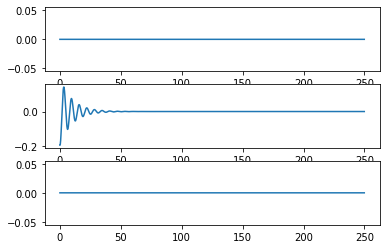

In [31]:
allstates = []
for index,t in enumerate(allt): # step through every time step

    allstates.append(thisstate)    
    nextstate = get_next_state_3CD(thisstate, dt)  
    thisstate = nextstate    
    
df3 = pd.DataFrame(np.row_stack(allstates), columns = ['x1', 'v1', 'x2', 'v2', 'x3', 'v3']) 
df3.insert(0, "time", allt, True) 
df3 = add_polar_coordinates(df3)

plt.subplot(311)
plt.plot(df1.time,df3.x1)
plt.subplot(312)
plt.plot(df1.time,df3.x2)
plt.subplot(313)
plt.plot(df1.time,df3.x3)

In [32]:
dfC = df3

In [33]:
# create position vectors for the first animated graph
data1,data2,data3,data4,data5 = ([],[],[],[],[])
for index,t in enumerate(allt): # step through every time step

    if index % 5 == 0: # take only every nth element    
        data1.append([[-3,-3+df.sin1[index]],[2,2-df.cos1[index]]]) # first number: x anchor; second number: y anchor 
        data2.append([[0,0+df.sin2[index]],[2,2-df.cos2[index]]]) # first number: x anchor; second number: y anchor 
        data3.append([[3,3+df.sin3[index]],[2,2-df.cos3[index]]]) # first number: x anchor; second number: y anchor 
        data4.append([[-3+df.sin1[index],0+df.sin2[index]],[2-df.cos1[index],2-df.cos2[index]]]) 
        data5.append([[0+df.sin2[index],3+df.sin3[index]],[2-df.cos2[index],2-df.cos3[index]]]) 

In [34]:
# call the animation function 
subplot1_data = [[np.asarray(data1),np.asarray(data2),np.asarray(data3),np.asarray(data4),np.asarray(data5)]]

thisfig = create_fig1()
add_pendulum_patches(thisfig)
lines1A[3].set_lw(1)
lines1A[4].set_lw(1)
lines1A[3].set_marker('')
lines1A[4].set_marker('')
lines1A[3].set_color('brown')
lines1A[4].set_color('brown')

ani = animation.FuncAnimation(thisfig,animate1,frames=200,interval=100,fargs=(subplot1_data))
rc('animation', html='jshtml')
ani        

## 4.5. Bringing it all together

In [35]:
df_all = pd.concat([dfA, dfB, dfC], ignore_index=True, sort=False)

In [36]:
df_all

,time,x1,v1,x2,v2,x3,v3,sin1,cos1,sin2,cos2,sin3,cos3
0,0.0,0.0,0.0,-1.000000e+00,0.000000e+00,0.0,0.0,0.0,1.0,-1.682942e+00,1.080605,0.0,1.0
1,0.1,0.0,0.0,-1.000000e+00,1.000000e-01,0.0,0.0,0.0,1.0,-1.682942e+00,1.080605,0.0,1.0
2,0.2,0.0,0.0,-9.900000e-01,1.988000e-01,0.0,0.0,0.0,1.0,-1.672052e+00,1.097380,0.0,1.0
3,0.3,0.0,0.0,-9.701200e-01,2.954144e-01,0.0,0.0,0.0,1.0,-1.649907e+00,1.130401,0.0,1.0
4,0.4,0.0,0.0,-9.405786e-01,3.888814e-01,0.0,0.0,0.0,1.0,-1.615798e+00,1.178641,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3031,249.5,0.0,0.0,6.792540e-13,-2.201910e-12,0.0,0.0,0.0,1.0,1.358508e-12,2.000000,0.0,1.0
3032,249.6,0.0,0.0,4.590630e-13,-2.203779e-12,0.0,0.0,0.0,1.0,9.181259e-13,2.000000,0.0,1.0
3033,249.7,0.0,0.0,2.386851e-13,-2.183571e-12,0.0,0.0,0.0,1.0,4.773702e-13,2.000000,0.0,1.0
3034,249.8,0.0,0.0,2.032797e-14,-2.141933e-12,0.0,0.0,0.0,1.0,4.065594e-14,2.000000,0.0,1.0


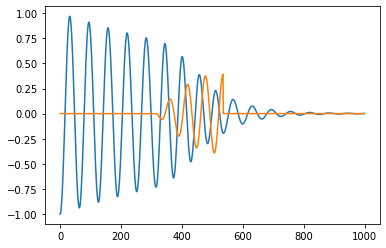

In [38]:
plt.plot(df_all.x2[:1000])
plt.plot(df_all.x1[:1000])
#plt.plot(df_all.x3[:1000])

## 4.6. Final touches (e.g. incoherent decay of receiver states)

In [39]:
df_all['anchor1x'] = -3
df_all['anchor1y'] = 2
df_all['anchor3x'] = 3
df_all['anchor3y'] = 2

In [40]:
df_all

,time,x1,v1,x2,v2,x3,v3,sin1,cos1,sin2,cos2,sin3,cos3,anchor1x,anchor1y,anchor3x,anchor3y
0,0.0,0.0,0.0,-1.000000e+00,0.000000e+00,0.0,0.0,0.0,1.0,-1.682942e+00,1.080605,0.0,1.0,-3,2,3,2
1,0.1,0.0,0.0,-1.000000e+00,1.000000e-01,0.0,0.0,0.0,1.0,-1.682942e+00,1.080605,0.0,1.0,-3,2,3,2
2,0.2,0.0,0.0,-9.900000e-01,1.988000e-01,0.0,0.0,0.0,1.0,-1.672052e+00,1.097380,0.0,1.0,-3,2,3,2
3,0.3,0.0,0.0,-9.701200e-01,2.954144e-01,0.0,0.0,0.0,1.0,-1.649907e+00,1.130401,0.0,1.0,-3,2,3,2
4,0.4,0.0,0.0,-9.405786e-01,3.888814e-01,0.0,0.0,0.0,1.0,-1.615798e+00,1.178641,0.0,1.0,-3,2,3,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3031,249.5,0.0,0.0,6.792540e-13,-2.201910e-12,0.0,0.0,0.0,1.0,1.358508e-12,2.000000,0.0,1.0,-3,2,3,2
3032,249.6,0.0,0.0,4.590630e-13,-2.203779e-12,0.0,0.0,0.0,1.0,9.181259e-13,2.000000,0.0,1.0,-3,2,3,2
3033,249.7,0.0,0.0,2.386851e-13,-2.183571e-12,0.0,0.0,0.0,1.0,4.773702e-13,2.000000,0.0,1.0,-3,2,3,2
3034,249.8,0.0,0.0,2.032797e-14,-2.141933e-12,0.0,0.0,0.0,1.0,4.065594e-14,2.000000,0.0,1.0,-3,2,3,2


In [41]:
offset = offset1+offset2+2-10
offset

526

In [42]:
df_all[offset-5:offset+5]

,time,x1,v1,x2,v2,x3,v3,sin1,cos1,sin2,cos2,sin3,cos3,anchor1x,anchor1y,anchor3x,anchor3y
521,20.6,0.004118,0.420863,0.073407,-0.257658,0.004118,0.420863,0.004118,0.999992,0.146682,1.994614,0.004118,0.999992,-3,2,3,2
522,20.7,0.046204,0.415415,0.047641,-0.261935,0.046204,0.415415,0.046188,0.998933,0.095246,1.997731,0.046188,0.998933,-3,2,3,2
523,20.8,0.087746,0.405147,0.021447,-0.262230,0.087746,0.405147,0.087633,0.996153,0.042891,1.999540,0.087633,0.996153,-3,2,3,2
524,20.9,0.128260,0.390180,-0.004776,-0.258568,0.128260,0.390180,0.127909,0.991786,-0.009551,1.999977,0.127909,0.991786,-3,2,3,2
525,21.0,0.167278,0.370693,-0.030632,-0.251029,0.167278,0.370693,0.166499,0.986042,-0.061255,1.999062,0.166499,0.986042,-3,2,3,2
526,21.1,0.204348,0.346916,-0.055735,-0.239752,0.204348,0.346916,0.202929,0.979194,-0.111413,1.996894,0.202929,0.979194,-3,2,3,2
527,21.2,0.239039,0.319130,-0.079711,-0.224926,0.239039,0.319130,0.236769,0.971566,-0.159252,1.993650,0.236769,0.971566,-3,2,3,2
528,21.3,0.270952,0.287665,-0.102203,-0.206793,0.270952,0.287665,0.267649,0.963516,-0.204051,1.989564,0.267649,0.963516,-3,2,3,2
529,21.4,0.299719,0.252892,-0.122882,-0.185639,0.299719,0.252892,0.295252,0.955420,-0.245147,1.984919,0.295252,0.955420,-3,2,3,2
530,21.5,0.325008,0.215221,-0.141446,-0.161794,0.325008,0.215221,0.319316,0.947648,-0.281950,1.980026,0.319316,0.947648,-3,2,3,2


In [43]:
remainingrows = df_all.sin1[offset:].shape[0]
remainingrows

2510

In [44]:
newsin1 = 0.380893 * np.linspace(1, 200, num=remainingrows)
newsin1.shape

(2510,)

In [45]:
newcos1 = 0.924619 * np.linspace(1, 200, num=remainingrows)
newcos1.shape

(2510,)

In [46]:
newsin3 = 0.380893 * np.linspace(1, 200, num=remainingrows)
newsin3.shape

(2510,)

In [47]:
newcos3 = 0.924619 * np.linspace(1, 200, num=remainingrows)
newcos3.shape

(2510,)

In [48]:
df_all.sin1[offset:] = 0 
df_all.cos1[offset:] = 0 
df_all.sin3[offset:] = 0 
df_all.cos3[offset:] = 0 

C:\Users\Florian\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\Florian\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\Florian\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package s

In [49]:
df_all.anchor1x[offset:] = -3+newsin1
df_all.anchor1y[offset:] = 2-newcos1
df_all.anchor3x[offset:] = 3+newsin3
df_all.anchor3y[offset:] = 2-newcos3

C:\Users\Florian\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
C:\Users\Florian\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\Users\Florian\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package s

## 4.7. Creating the final animations

First, we'll create a special function that makes the coupling lines disappear when there is no coupling. 

In [50]:
def animate1special(i,data_graph1): # animation function that is called once for every frame (for fig 1)
    global lines1A,offset1,offset2,thisfig
      
    if i == int(offset1/5):
        lines1A[3].set_lw(1)
        lines1A[4].set_lw(1)          
        thisaxis = thisfig.axes[0]
        thisaxis.add_patch(patches.Rectangle(xy=(-5, -3),width=10,height=5,facecolor="red",alpha=0.05))

    if i == int((offset1+offset2)/5):
        lines1A[3].set_lw(0)
        lines1A[4].set_lw(0)           
        
    for lineno,_ in enumerate(data_graph1): # strep through the list and the data for each line and assign data for frame i
        
        lines1A[lineno].set_xdata(data_graph1[lineno][i][0]) 
        lines1A[lineno].set_ydata(data_graph1[lineno][i][1])

First let's consider an excited state with damping and with no couplings. So the excited state will decay on an exponential trajectory.

In [51]:
df = df1

# create position vectors for the first animated graph
data1,data2,data3,data4,data5 = ([],[],[],[],[])
for index,t in enumerate(allt): # step through every time step

    if index % 5 == 0: # take only every nth element    
        data1.append([[-3,-3+df.sin1[index]],[2,2-df.cos1[index]]]) # first number: x anchor; second number: y anchor 
        data2.append([[0,0+df.sin2[index]],[2,2-df.cos2[index]]]) # first number: x anchor; second number: y anchor 
        data3.append([[3,3+df.sin3[index]],[2,2-df.cos3[index]]]) # first number: x anchor; second number: y anchor 
        data4.append([[-3+df.sin1[index],0+df.sin2[index]],[2-df.cos1[index],2-df.cos2[index]]]) 
        data5.append([[0+df.sin2[index],3+df.sin3[index]],[2-df.cos2[index],2-df.cos3[index]]]) 

In [52]:
# call the animation function 
subplot1_data = [[np.asarray(data1),np.asarray(data2),np.asarray(data3),np.asarray(data4),np.asarray(data5)]]

thisfig = create_fig1()
add_pendulum_patches(thisfig)
lines1A[3].set_lw(0)
lines1A[4].set_lw(0)
lines1A[3].set_marker('')
lines1A[4].set_marker('')
lines1A[3].set_color('brown')
lines1A[4].set_color('brown')

ani = animation.FuncAnimation(thisfig,animate1,frames=250,interval=100,fargs=(subplot1_data)) # blit=True,
rc('animation', html='jshtml')
ani        

Next, we consider the same system but at a time t we generate a coupling between the excited states and two matching states. If the coupling is phonon-nuclear in nature, it could be created by switching on a laser. In this sytem, each of the two matching states capable of absorbing half of the energy of the excited state. We will also assume that the resulting states of the receivers are unstable and lead to incoherent decay. If these are nuclei, this could mean incoherent disintegtration for instance via alpha or proton emission. 

In [53]:
df = df_all

# create position vectors for the first animated graph
data1,data2,data3,data4,data5 = ([],[],[],[],[])
for index,t in enumerate(allt): # step through every time step

    if index % 5 == 0: # take only every nth element    
        data1.append([[df.anchor1x[index],df.anchor1x[index]+df.sin1[index]],[df.anchor1y[index],df.anchor1y[index]-df.cos1[index]]]) 
        data2.append([[0,0+df.sin2[index]],[2,2-df.cos2[index]]]) # first number: x anchor; second number: y anchor 
        data3.append([[df.anchor3x[index],df.anchor3x[index]+df.sin1[index]],[df.anchor3y[index],df.anchor3y[index]-df.cos1[index]]]) 
        data4.append([[-3+df.sin1[index],0+df.sin2[index]],[2-df.cos1[index],2-df.cos2[index]]]) 
        data5.append([[0+df.sin2[index],3+df.sin3[index]],[2-df.cos2[index],2-df.cos3[index]]]) 

In [54]:
# call the animation function 
subplot1_data = [[np.asarray(data1),np.asarray(data2),np.asarray(data3),np.asarray(data4),np.asarray(data5)]]

thisfig = create_fig1()
add_pendulum_patches(thisfig)
lines1A[3].set_lw(0)
lines1A[4].set_lw(0)
lines1A[3].set_marker('')
lines1A[4].set_marker('')
lines1A[3].set_color('brown')
lines1A[4].set_color('brown')

ani = animation.FuncAnimation(thisfig,animate1special,frames=200,interval=100,fargs=(subplot1_data)) # blit=True,
rc('animation', html='jshtml')
ani        

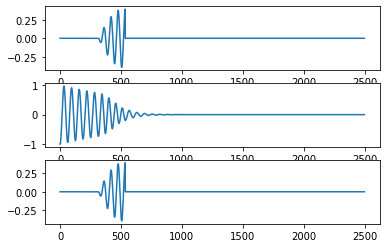

In [55]:
plt.subplot(311)
plt.plot(df_all.x1[:2500])
plt.subplot(312)
plt.plot(df_all.x2[:2500])
plt.subplot(313)
plt.plot(df_all.x3[:2500])

Finally, we can see the decay rate enhancement if we plot together the decay trajectory of the excited state for the uncoupled and coupled system. 

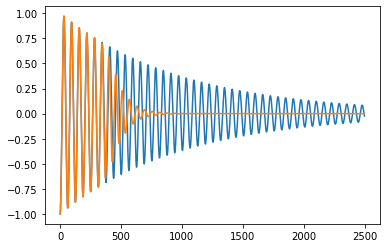

In [56]:
plt.plot(df1.x2)
plt.plot(df_all.x2[:2500])